<h1 style="text-align: center;">Climate data in Python practical</h1>
<p style="text-align: center;"><i>ERCA 2023 - Rémy Lapere</i></p>

In this tutorial we will:
> Load `CMIP6` climate data directly into `Python` through `Pangeo` <br />
> Use `xarray` and `pandas` to manipulate the data (selection, averaging, resampling, interpolation...) <br />
> Plot fancy maps using `cartopy` and with custom colorbars <br />
> Learn that you can easily download `Copernicus` data through their `Python` API <br />
> As a bonus: make your data sing

Some of the python libraries we will need are not readily available on the UGA `Jupyterlab` and need to be installed first. If you chose to use that platform for the tutorial, you can run the cells below.

In [1]:
# Install a pip package in the current Jupyter kernel
# only run this once then comment out
# This may take some time but it is necessary to be able to run the notebook on the UGA JupyterHub
#import sys
#!{sys.executable} -m pip install xarray
#!{sys.executable} -m pip install miditime
#!{sys.executable} -m pip install intake
#!{sys.executable} -m conda install -y -c conda-forge intake-esm
#!{sys.executable} -m pip install intake-xarray
#!{sys.executable} -m pip install aiohttp
#!{sys.executable} -m pip install requests
#!{sys.executable} -m pip install gcsfs
#!{sys.executable} -m pip install pygame
#!{sys.executable} -m pip install python-vlc
#!{sys.executable} -m pip install cftime
#!{sys.executable} -m pip install cartopy
#!{sys.executable} -m pip install seaborn
#!{sys.executable} -m pip install hvplot
#!{sys.executable} -m conda install -y -c pyviz holoviews bokeh
#!{sys.executable} -m pip install cdsapi
#!{sys.executable} -m pip install fsspec
#!{sys.executable} -m pip install pymannkendall
#!{sys.executable} -m pip install scipy

First thing to do in `Python`: load the libraries that will be useful for our project.

In [2]:
%load_ext autoreload
%autoreload 2

In [2]:
import xarray as xr
xr.set_options(display_style='html')
import intake
import cftime
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.path as mpath
import seaborn as sns
import warnings
import cartopy
import cartopy.crs as ccrs
import vlc
import hvplot.xarray
import hvplot
import cdsapi
import fsspec
import pymannkendall as mk
import scipy
warnings.filterwarnings("ignore")
#plt.rcParams.update({'font.size': 12})
#mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['figure.figsize'] = (12, 7)
pd.options.plotting.backend = 'hvplot'

# custom library of useful homemade functions
from functions import *

<h1 style="text-align: center;">SECTION 1: load climate data from Pangeo</h1>

`Pangeo` is a community platform for Big Data geoscience (https://pangeo.io/) which, among other things, provides access to data catalogs such as `CMIP6` output. Using the associated python libraries is a powerful tool for the analysis of climate data without ever having to download and store them.

The workflow I recommend for this use is:
1. Assess the existence of the `CMIP6` data you are interested in through the `ESGF` platform (https://esgf-node.ipsl.upmc.fr/search/cmip6-ipsl/). I recommend using the `CMIP6` data catalog (https://clipc-services.ceda.ac.uk//dreq/mipVars.html) for better understanding of the variable names and contents
2. Once you have identified the data sets you want on `ESGF`, apply the associated filters in the scripts below when searching the `Pangeo` catalog

#### Connect to the pangeo storage catalog using `intake`

In [4]:
cat_url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
col = intake.open_esm_datastore(cat_url)

#### Search through the catalog
In this example, we want to look at monthly ('Amon') surface temperature ('tas') in one CMIP6 model ('NorESM2-MM'), for the 'historical' experiment and the variant 'r1i1p1f1'. We do a search through the pangeo catalog using the appropriate keys.

In [5]:
cat = col.search(variable_id=['tas'], 
                 member_id=['r1i1p1f1'],
                 source_id=['NorESM2-MM'],
                 experiment_id=['historical'],
                 table_id=['Amon'])

NB: you can do a search for multiple values in each field, e.g. you can try loading precipitation as well by replacing, ['tas'] with ['tas','pr']. This applies for any field in the search

#### Make a dictionary from the search results

In [6]:
dset_dict = cat.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


#### List the available keys in the dictionary to make sure we got what we wanted

In [7]:
dataset_list = list(dset_dict.keys())
dataset_list

['CMIP.NCC.NorESM2-MM.historical.Amon.gn']

#### Select the data set
In this case there is only one data set in the search (hence the dataset_list[0] below), but you can load several data sets at once e.g. if you also want precipitation, variable_id=['tas'] above becomes variable_id=['tas','pr'] and you would have to select each separately (dataset_list[0] and dataset_list[1]).

Also, here we use the .chunk() method to chunk the data set into smaller pieces to make loading faster. For this tutorial you don't have to care but if you use `xarray` in the future it can be convenient to know more about .chunk() (and `dask`).

In [8]:
dset = dset_dict[dataset_list[0]].chunk(chunks={'time':20,'lat':10,'lon':10})
dset

<xarray.Dataset>
Dimensions:    (lat: 192, bnds: 2, lon: 288, member_id: 1, time: 1980)
Coordinates:
    height     float64 ...
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(10, 2), meta=np.ndarray>
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(10, 2), meta=np.ndarray>
  * time       (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
    time_bnds  (time, bnds) object dask.array<chunksize=(20, 2), meta=np.ndarray>
  * member_id  (member_id) <U8 'r1i1p1f1'
Dimensions without coordinates: bnds
Data variables:
    tas        (member_id, time, lat, lon) float32 dask.array<chunksize=(1, 20, 10, 10), meta=np.ndarray>
Attributes: (12/54)
    Conventions:               CF-1.7 CMIP-6.2
    activity_id:               CMIP
    branch_method:             Hybrid-restart from year 1200-01-01 of piControl
    branch_time:               0.0
    branch_time_in_child:      0.0
    branch_time_in_parent:     438000.0
    ...                        ...
    variable_id:               tas
    variant_label:             r1i1p1f1
    netcdf_tracking_ids:       hdl:21.14100/b726dcce-04e7-41ef-8f32-a36cffa51...
    version_id:                v20191108
    intake_esm_varname:        ['tas']
    intake_esm_dataset_key:    CMIP.NCC.NorESM2-MM.historical.Amon.gn

If you prefer to use a dataset that you have locally for what comes next, you can equivalently load the data into `xarray` with xr.open_dataset() and start from here (see Section Copernicus for an example using xr.open_dataset()).

---
---

<h1 style="text-align: center;">SECTION 2: select, resample, groupby...</h1>

The data previously loaded is "stored" in an `xarray` dataset. This is probably the most convenient way to deal with large data sets in `Python` as the data is not fully loaded in cache as `numpy`-based libraries would do. As a result, all the manipulations on the data (averaging, resampling...) are very fast. If you haven't yet, I highly recommend you make the switch to `xarray` if you manupilate `netcdf` files regularly. It could change your life (no exaggeration).

You don't have to take my word for it, just try it yourself with the following examples. If you are curious, you can convert the `xarray` dataset used here into a `numpy` and try to make the same manipulations so you can compare computing times.

Now let's play around with the data, select specific areas, time periods, aggregate data 

### The .sel() method of `xarray`

This method allows you to select values or a range of values along any dimension of the data set. Here is an example where we select over time and latitutde/longitude.

In [9]:
# select only a few years using the .sel() method
dset = dset.sel(time=slice('1990','2014')).squeeze()

# select a lat/lon region in the world
# feel free to change these values to whatever region you'd like to study
tas_subregion = dset.sel(lat=slice(-80,0),lon=slice(250,350))

Let's plot the result of the selection by looking at the first time in the data set. If you know what is the value of the time step you want you can use the .sel() method (e.g. .sel(time='1990-01')). If you do not know how it is called but you know it is the n$^{\textrm{th}}$ step, you can use .isel() as .isel(time=n-1) as we are doing here.

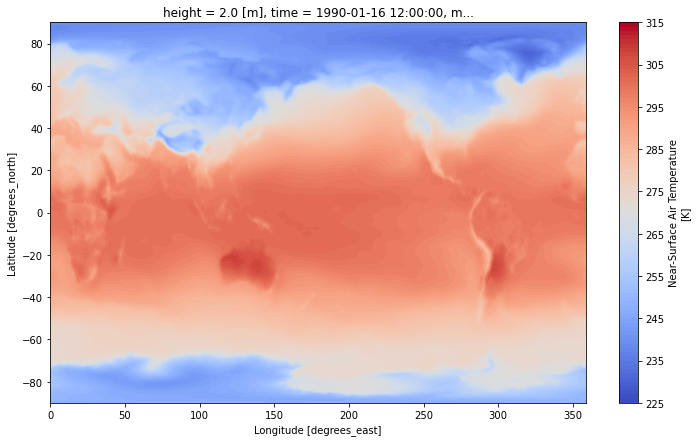

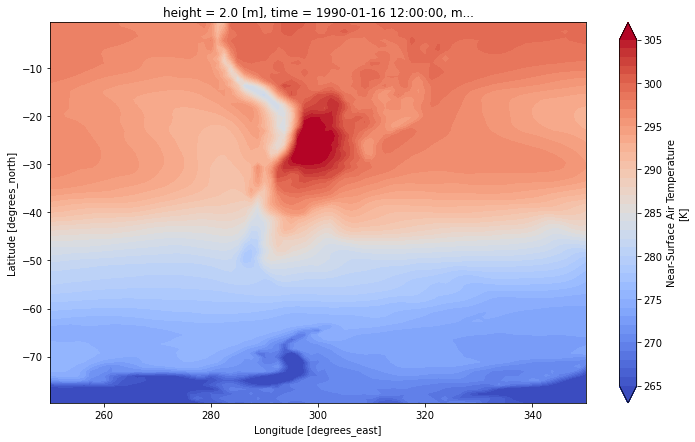

In [10]:
# plot the first time step as a filled contour

# of the whole domain
dset.tas.isel(time=0).plot.contourf(levels=np.linspace(225,315,91),
                                    cmap='coolwarm')
plt.show()

# of the selected region
tas_subregion.tas.isel(time=0).plot.contourf(levels=np.linspace(265,305,41),
                                             cmap='coolwarm')
plt.show()

### The mean(), resample() and groupby() methods of `xarray`

The .mean() method allows you to average your data set over any dimension/group of dimensions. You can use, equivalently, the .min(), .max(), .median(), .quantile() methods for min, max, median or quantile computation. In this example we will take the spatial average of temperature over the selected subregion.
NB: spatial averages need to account for the fact that the latitude-km relationship changes with latitude, hence the weighted mean instead of a simple mean.

The .resample() methods allows you to resample the data at a certain frequency. Resampling needs to be followed by one of the methods above (mean, min, max...). For example, here we want to compute the yearly maximum temperature, so we .resample() by year and take the .max().

The .groupby() method is useful to group data by a given criterion. In the example below we will apply it to obtain the min and max values of the regional mean for each calendar month over the period (e.g. min and max January values for the period).

In [11]:
# spatial weighted mean
weights = np.cos(np.deg2rad(tas_subregion.lat))
tas_subregion_avg = tas_subregion.weighted(weights).mean(dim=('lat','lon'))

# groupby() to get the mean/min/max for each calendar month over the period
tas_subregion_avg_mn = tas_subregion_avg.groupby(tas_subregion_avg.time.dt.month).mean()
tas_subregion_avg_min = tas_subregion_avg.groupby(tas_subregion_avg.time.dt.month).min()
tas_subregion_avg_max = tas_subregion_avg.groupby(tas_subregion_avg.time.dt.month).max()

# resample() to aggregate data from monthly to annual
# and apply the .max() method to get the annual maximum
tas_subregion_yearly_max = tas_subregion.resample(time='1Y').max()

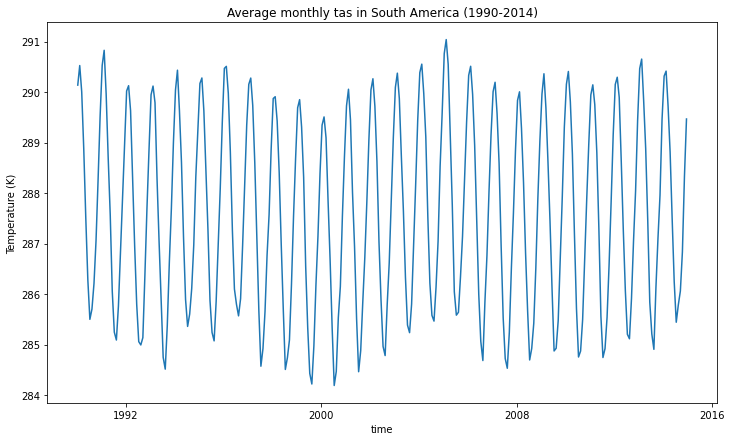

In [12]:
tas_subregion_avg.tas.plot()
plt.title('Average monthly tas in South America (1990-2014)')
plt.ylabel('Temperature (K)')
plt.show()

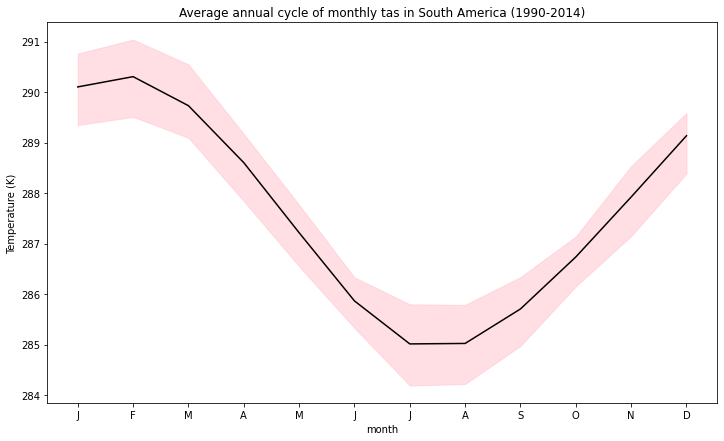

In [13]:
tas_subregion_avg_mn.tas.plot(color='black')

plt.fill_between(tas_subregion_avg_min.month,
                 tas_subregion_avg_min.tas,
                 tas_subregion_avg_max.tas,
                 color='pink',
                 alpha=0.5,
                 zorder=0)
plt.xticks(np.arange(1,13),['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.title('Average annual cycle of monthly tas in South America (1990-2014)')
plt.ylabel('Temperature (K)')
plt.show()

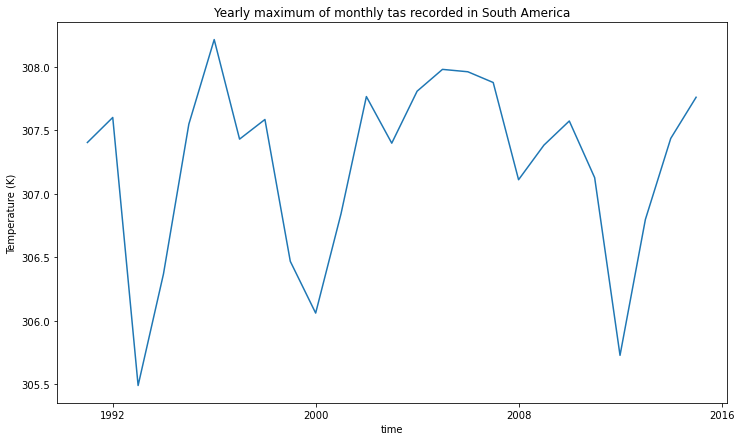

In [14]:
tas_subregion_yearly_max.tas.max(dim=('lat','lon')).plot()
plt.title('Yearly maximum of monthly tas recorded in South America')
plt.ylabel('Temperature (K)')
#plt.xticks(np.arange(0,25,5),np.arange(1990,2015,5))
plt.show()

#### Give it a try yourself
Think of a manipulation you would need to do in real life and implement it and then plot the result.

---
---

<h1 style="text-align: center;">SECTION 3: plot nice maps!</h1>



In this section, we will use `cartopy` to plot geospatial data, and a homemade function to create custom colorbars.

Let's say we want to plot 
- the average monthly surface air temperature
- for NH summer months only
- for the years 2000 to 2010 only

#### Write the appropriate sel and mean methods to do that below

In [15]:
tas_jja = dset.sel(time=dset['time.season']=='JJA')

# select 2000 to 2010 only
tas_jja_2000_2010 = tas_jja.sel(time=slice('2000','2010'))

# average along time dimension
tas_mean_jja_2000_2010 = tas_jja_2000_2010.tas.mean(dim='time').squeeze()

Now we will make map plots of this data. Available colormaps in `matplotlib` can quickly become quite limited. Below is a homemade function to create a custom colorbar of your choice (see functions.py for how it works - kudos to Theodore Kadir for creating it).
The first argument is a list of rgb colors, N is the number of intervals you want, and if you want the colorbar to go in reverse direction, set reverse='r'

In [16]:
cmap_GoldenTheo = build_cmap(colors=[(5/256, 41/256, 132/256),(175/256, 186/256, 219/256),
                              (249/256, 240/256, 216/256),(237/256, 204/256, 142/256),
                              (126/256, 90/256, 79/256)], 
                             N=25,
                             reverse='no')

We will use `cartopy` to plot our maps, using 3 different projections

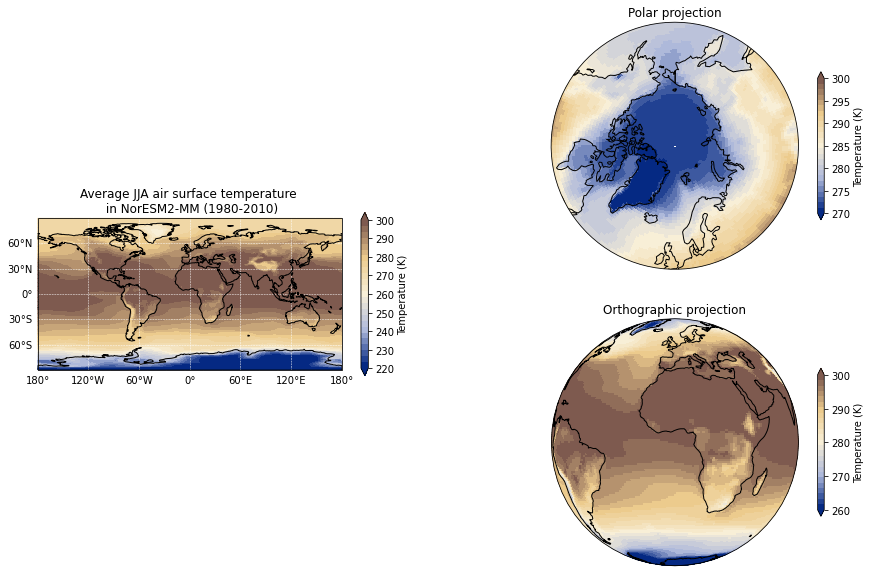

In [17]:
# create figure and define its size
fig = plt.figure(figsize=(15,10))

# use the PlateCarree projection
ax1 = plt.subplot(1,2,1,projection=ccrs.PlateCarree())
ax1.set_extent([-180,180,-90,90], ccrs.PlateCarree())
ax1.add_feature(cartopy.feature.LAND,edgecolor='k',zorder=4,facecolor=(1,1,1,0))
ax1.set_title('Average JJA air surface temperature \n in NorESM2-MM (1980-2010)')
gl = ax1.gridlines(crs=ccrs.PlateCarree(),
                   draw_labels=True,
                   linewidth=0.5,
                   color='white',
                   linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False

c1 = ax1.pcolormesh(tas_mean_jja_2000_2010.lon,
                    tas_mean_jja_2000_2010.lat,
                    tas_mean_jja_2000_2010,
                    cmap = cmap_GoldenTheo,
                    vmin = 220,
                    vmax = 300)

plt.colorbar(c1, shrink=0.3, label='Temperature (K)', extend='both')

# use a polar projection
ax2 = plt.subplot(2,2,2,projection=ccrs.NorthPolarStereo())
ax2.set_extent([-180,180,50,90], ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='k',zorder=4,facecolor=(1,1,1,0))
ax2.set_title('Polar projection')
theta = np.linspace(0, 2*np.pi, 100)                                                                                                                                                                       
center, radius = [0.5, 0.5], 0.5                                                                                                                                                                           
verts = np.vstack([np.sin(theta), np.cos(theta)]).T                                                                                                                                                        
circle = mpath.Path(verts * radius + center)                                                                                                                                                               
ax2.set_boundary(circle, transform=ax2.transAxes) 

c2 = ax2.pcolormesh(tas_mean_jja_2000_2010.lon,
                    tas_mean_jja_2000_2010.lat,
                    tas_mean_jja_2000_2010,
                    cmap = cmap_GoldenTheo,
                    vmin = 270,
                    vmax = 300,
                    transform=ccrs.PlateCarree())

plt.colorbar(c2, shrink=0.6, label='Temperature (K)', extend='both')

# use an orthographic projection
ax3 = plt.subplot(2,2,4,projection=ccrs.Orthographic())
ax3.add_feature(cartopy.feature.LAND,edgecolor='k',zorder=4,facecolor=(1,1,1,0))
ax3.set_title('Orthographic projection')

c3 = ax3.pcolormesh(tas_mean_jja_2000_2010.lon,
                    tas_mean_jja_2000_2010.lat,
                    tas_mean_jja_2000_2010,
                    cmap = cmap_GoldenTheo,
                    vmin = 260,
                    vmax = 300,
                    transform=ccrs.PlateCarree())

plt.colorbar(c3, shrink=0.6, label='Temperature (K)', extend='both')


plt.show()

---
---

<h1 style="text-align: center;">SECTION 4: interpolate and compare to observations</h1>

In this section, we will compare the `CMIP` simulated temperature to observed data in Santiago, Chile (because... why not). This will require spatial interpolation, which can be nicely done with `xarray`

First load the observation data which is stored as a csv file, using `pandas` read_csv methods. This dataset is hourly surface temperature measured in Santiago, Chile, for 2004-2021. Downloaded from SINCA (https://sinca.mma.gob.cl/) on Dec. 20, 2022.

After loading the data into a `pandas` dataframe (which is the equivalent of an xarray but in 2 dimensions), we transform the data to keep only the relevant years and resample from hourly to monthly values, like in CMIP.

In [34]:
obs = pd.read_csv('Temp_Santiago_hourly_2004-2021.csv',
                  header=0,
                  sep=',',
                  index_col=False,
                  parse_dates=['Time'])

obs.head()

,Unnamed: 0,Time,Temp
0,0,2004-01-01 01:00:00,17.4916
1,1,2004-01-01 02:00:00,16.4167
2,2,2004-01-01 03:00:00,15.6416
3,3,2004-01-01 04:00:00,14.8833
4,4,2004-01-01 05:00:00,14.5333


In [19]:
# take only until 2014 to match CMIP period
obs = obs[obs.Time.dt.year<=2014]

# hourly data to monthly mean
obs["month"] = obs.Time.dt.month
obs["year"] = obs.Time.dt.year
obs_monthly = obs.groupby(['year','month'],as_index=False).mean()

Take only 2004-2014 in CMIP to match the observation period and interpolate to the nearest grid point to our measurement station. For the latter we use the .interp() method of `xarray`. There are several interpolation methods in `xarray`, go check them out they can be very useful. For example if you want to compare 2 maps that are on different grids and make a difference map, this can be done with `xarray` interp_like() method (see also next section).

In [20]:
temp_santiago_cmip = dset.sel(time=slice('2004','2014')).interp(lat=[-33.5],lon=[360-70.65],method='nearest').squeeze()
temp_santiago_cmip -= 273.15

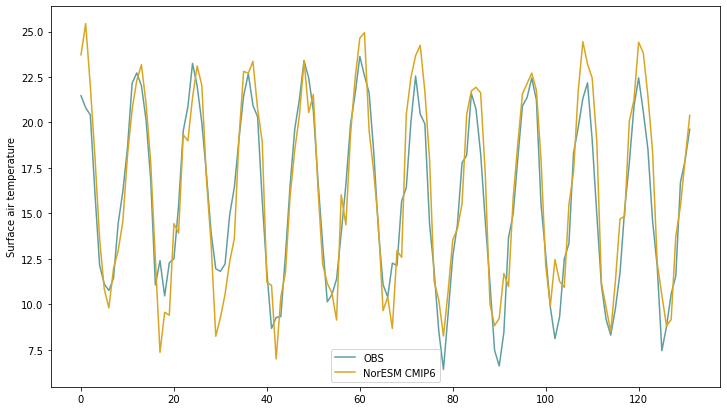

In [21]:
plt.plot(obs_monthly.Temp.values,
         label='OBS',
         color='cadetblue')
plt.plot(temp_santiago_cmip.tas.values,
         label='NorESM CMIP6',
         color='goldenrod')
plt.ylabel('Surface air temperature')
plt.legend()
plt.show()

Now let's compare annual cycles like before

In [22]:
temp_santiago_cmip_monthly = temp_santiago_cmip.groupby(temp_santiago_cmip.time.dt.month).mean().squeeze()
temp_santiago_cmip_monthly_std = temp_santiago_cmip.groupby(temp_santiago_cmip.time.dt.month).std().squeeze()
obs_month = obs.groupby(['month'],as_index=False).mean()

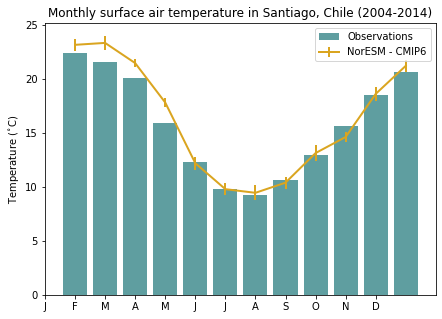

In [24]:
fig = plt.figure(figsize=(7,5))

plt.bar(obs_month.month,
        obs_month.Temp,
        color='cadetblue',
        label='Observations')

plt.errorbar(temp_santiago_cmip_monthly.month,
             temp_santiago_cmip_monthly.tas,
             yerr=temp_santiago_cmip_monthly_std.tas/2.0,
             linewidth=2,
             color='goldenrod',
             label='NorESM - CMIP6')

plt.xticks(range(12),['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.ylabel('Temperature ($^{\circ}$C)')
plt.title('Monthly surface air temperature in Santiago, Chile (2004-2014)')
plt.legend()
plt.show()

---
---

<h1 style="text-align: center;">SECTION 5: Copernicus data</h1>

`Copernicus` data such as `ERA5` (climate reanalysis) or `CAMS` (air quality reanalysis) are available through the `Copernicus Climate Data Store` (https://cds.climate.copernicus.eu/).

A very interesting feature is that they provide the possibility to download the data via their web API, or through a `python` API, which you can run as a script from any server you might use for your work. For the latter option, they provide a tutorial here: https://cds.climate.copernicus.eu/api-how-to. This is a very convenient way to obtain the data. 

You can also load the data in the notebook without downloading locally, but it is quite slow. If you are already familiar with the `Climate Data Store` and have an API key you can give it a try with the code in the next cell.

We won't demonstrate this here because the setup requires that you create an account and generate an API key if you don't have one, but I strongly recommend you have a look on your own if you are using Copernicus data in the future.

For the purpose of the next exercise I already downloaded the monthly reanalysis of surface temperature from `ERA5` for the year 2010. As an illustration for the interpolation capabilities of `xarray`, we will make a difference map between `CMIP` and `ERA5` values, using the `interp_like()` method from `xarray`.

In [ ]:
########################################################################
#### EXAMPLE TO BE TESTED ON YOUR MACHINE IF YOU HAVE A CDSAPI KEY #####
########################################################################

#c = cdsapi.Client()
#r = c.retrieve(
#    'reanalysis-era5-single-levels-monthly-means',
#    {
#        'product_type': 'monthly_averaged_reanalysis',
#        'variable': '2m_temperature',
#        'year': '2010',
#        'month': [
#            '01', '02', '03',
#            '04', '05', '06',
#            '07', '08', '09',
#            '10', '11', '12',
#        ],
#        'time': '00:00',
#        'format': 'netcdf',
#    })

#with fsspec.open(r.location) as f:
#    ds = xr.open_dataset(f, engine='scipy')
#    print(ds)

#ds.mean(dim='time').t2m.plot()

Open ERA5 temperature data set and rename fields to CMIP convention for the interpolation

In [25]:
era5 = xr.open_dataset('ERA5_monthly_temp_2010.nc')
era5 = era5.rename({'latitude':'lat','longitude':'lon','t2m':'tas','time':'Time'})

Select only 2004-2014 in CMIP and drop useless dimension/attributes

In [26]:
dset_ = dset.sel(time='2010').squeeze()
dset_ = dset_.drop(['height','lat_bnds','lon_bnds','member_id','time_bnds'])

Now we have 2 data sets with the same variables/variable names, we can interpolate.

Warning: `CMIP` and `ERA5` use different time conventions. `CMIP` January is 01/16, `ERA5` January is 01/01. That's why I renamed the 'time' dimension in `ERA5`, to make it different so that interp_like() does not try to interpolate on this dimension. Otherwise you get NaN values. After interpolation I do the reverse operation and affect the CMIP time to ERA5 to ease manipulation in the continuation

In [27]:
era5_interp = era5.interp_like(dset_)
era5_interp = era5_interp.rename({'Time':'time'})
era5_interp['time'] = dset_['time']

Now we have all the data on the same grid, we cam plot a difference map

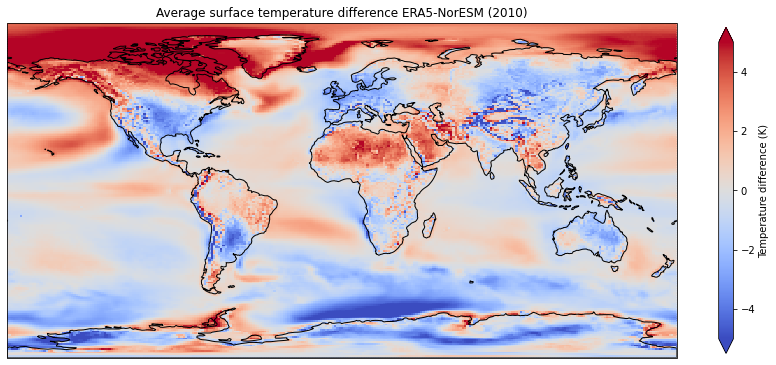

In [28]:
diff_era_cmip = (era5_interp - dset_).mean(dim='time')

fig = plt.figure(figsize=(15,10))

ax1 = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax1.set_extent([-180,180,-90,90], ccrs.PlateCarree())
ax1.add_feature(cartopy.feature.LAND,edgecolor='k',zorder=4,facecolor=(1,1,1,0))
ax1.set_title('Average surface temperature difference ERA5-NorESM (2010)')

c1 = ax1.pcolormesh(diff_era_cmip.lon,
                    diff_era_cmip.lat,
                    diff_era_cmip.tas,
                    cmap = 'coolwarm',
                    vmin = -5,
                    vmax = 5)

plt.colorbar(c1, shrink=0.6, label='Temperature difference (K)', extend='both')

plt.show()

---
--- 

<h1 style="text-align: center;">SECTION 6: Pandas essentials</h1>

We will use again data from the air quality network of Santiago Chile, to learn the essentials of data processing with `pandas`. We have 5 data sets at our disposal, which are .csv files of hourly time series of observed temperature, PM10 concentration, Ozone mixing ratio, wind speed and relative humidity, for the period 2004-2021.

Let's try opening one of the data sets to see how it looks

In [42]:
pm = pd.read_csv('PM10_Santiago_2004-2021.csv', header=0, sep=';')
pm.head()

,FECHA (YYMMDD),HORA (HHMM),Registros validados,Registros preliminares,Registros no validados,Unnamed: 5
0,40101,100,38,NaN,NaN,NaN
1,40101,200,67,NaN,NaN,NaN
2,40101,300,72,NaN,NaN,NaN
3,40101,400,71,NaN,NaN,NaN
4,40101,500,69,NaN,NaN,NaN


This is the raw data provided by the website, some re-modeling is needed. 

First let's drop the columns we are not interested in (everything after 'Registros validados' in our case)

In [43]:
pm.drop(['Registros preliminares','Registros no validados','Unnamed: 5'], axis=1, inplace=True)
pm.head()

,FECHA (YYMMDD),HORA (HHMM),Registros validados
0,40101,100,38
1,40101,200,67
2,40101,300,72
3,40101,400,71
4,40101,500,69


Then, let's rename the columns with better names.

In [48]:
new_names = {'FECHA (YYMMDD)':'date',
             'HORA (HHMM)':'hour',
             'Registros validados':'PM10'}
pm.rename(mapper=new_names, axis=1, inplace=True)
pm.head()

,date,hour,PM10
0,40101,100,38
1,40101,200,67
2,40101,300,72
3,40101,400,71
4,40101,500,69


Now let's use a better convention for time definition

In [52]:
pm['time'] = pd.to_datetime(pm.date.apply(str).str.zfill(6)+'-'+pm.hour.apply(str).str.zfill(4), 
                            format='%y%m%d-%H%M')
pm.head()

,date,hour,PM10,time
0,40101,100,38,2004-01-01 01:00:00
1,40101,200,67,2004-01-01 02:00:00
2,40101,300,72,2004-01-01 03:00:00
3,40101,400,71,2004-01-01 04:00:00
4,40101,500,69,2004-01-01 05:00:00


We will deal with several data sets so let's make a function that does all these transformations so we do not have to write them for every data set

In [81]:
def clean_data(input_file, variable):
    df = pd.read_csv(input_file, 
                     header=0, 
                     sep=';',
                     decimal=',')
    df = df.iloc[:,0:3]
    new_names = {'FECHA (YYMMDD)':'date','HORA (HHMM)':'hour','Registros validados':variable}
    df.rename(mapper=new_names, 
              axis=1, 
              inplace=True)
    df['time'] = pd.to_datetime(df.date.apply(str).str.zfill(6)+'-'+df.hour.apply(str).str.zfill(4), 
                                format='%y%m%d-%H%M')
    df.drop(['date','hour'], 
            axis=1, 
            inplace=True)
    return df

In [88]:
pm = clean_data('PM10_Santiago_2004-2021.csv','PM10')
o3 = clean_data('O3_Santiago_2004-2021.csv','ozone')
ws = clean_data('Wind_Santiago_2004-2021.csv','windspeed')
rh = clean_data('RH_Santiago_2004-2021.csv','relh')
t2 = clean_data('Temp_Santiago_2004-2021.csv','t')

First look at the data

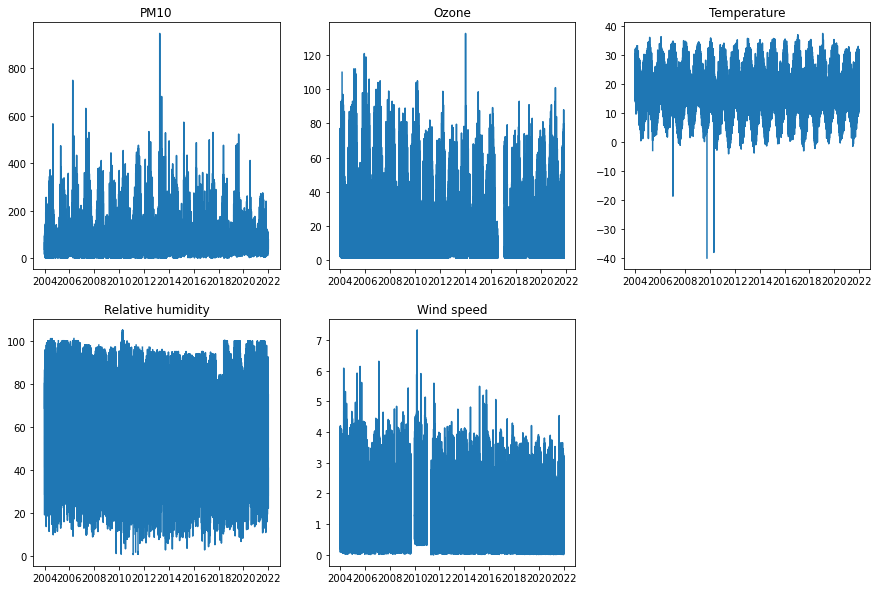

In [93]:
fig = plt.figure(figsize=(15,10))

plt.subplot(231)
plt.plot(pm.time,pm.PM10)
plt.title('PM10')

plt.subplot(232)
plt.plot(o3.time,o3.ozone)
plt.title('Ozone')

plt.subplot(233)
plt.plot(t2.time,t2.t)
plt.title('Temperature')

plt.subplot(234)
plt.plot(rh.time,rh.relh)
plt.title('Relative humidity')

plt.subplot(235)
plt.plot(ws.time,ws.windspeed)
plt.title('Wind speed')

plt.show()

## Seasonality analysis

We have a hourly data set. This is quite impossible to read. To make sense of it we want, for example, to look at the annual cycle. This essentilly implies to group the data by month or season, as is done in the example below using the .groupby() method of `pandas`.

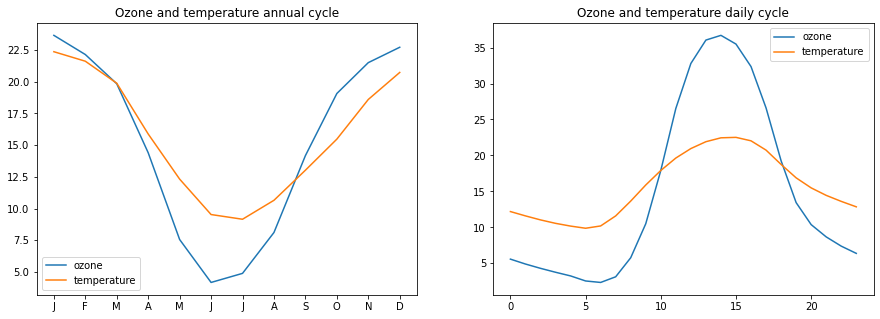

In [158]:
o3['month'] = o3.time.dt.month
o3['hour'] = o3.time.dt.hour
o3_month = o3.groupby('month',as_index=False).mean()
o3_hour = o3.groupby('hour',as_index=False).mean()

t2['month'] = t2.time.dt.month
t2['hour'] = t2.time.dt.hour
t2_month = t2.groupby('month',as_index=False).mean()
t2_hour = t2.groupby('hour',as_index=False).mean()

fig = plt.figure(figsize=(15,5))

plt.subplot(121)
plt.plot(o3_month.month,o3_month.ozone,label='ozone')
plt.plot(t2_month.month,t2_month.t,label='temperature')
plt.title('Ozone and temperature annual cycle')
plt.xticks(o3_month.month,['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.legend()

plt.subplot(122)
plt.plot(o3_hour.hour,o3_hour.ozone,label='ozone')
plt.plot(t2_hour.hour,t2_hour.t,label='temperature')
plt.title('Ozone and temperature daily cycle')
plt.legend()

plt.show()

Ozone and temperature seem to be closely related, let's compute their correlation

In [162]:
import scipy

# eliminate the NaN in both data sets to be able to compute pearson correlation coefficient
nans = np.logical_or(np.isnan(o3.ozone.values),np.isnan(t2.t))
ozone = o3.ozone.values[~nans]
temp = t2.t.values[~nans]

# now we can compute the correlation coefficient of ozone and temp and its confidence interval

alpha = 0.05 # here confidence interval at the 95% level

# correlation coefficient
r = scipy.stats.pearsonr(ozone,temp)[0]

# confidence interval computation
z_critical = scipy.stats.norm.ppf(1 - alpha)
z_prime = 0.5*np.log((1+r)/(1-r))
n = np.shape(ozone)[0]
se = 1./np.sqrt(n-3)
z_low = z_prime-z_critical*se
z_up = z_prime+z_critical*se
CI_1 = (np.exp(2*z_low)-1)/(np.exp(2*z_low)+1)
CI_0 = (np.exp(2*z_up)-1)/(np.exp(2*z_up)+1)

print('The correlation is ' +
      str(round(r,2)) + 
      ' ['+str(round(CI_1,3))+','+str(round(CI_0,3)) + 
      '] at the '+str(int((1-alpha)*100))+'% level')

The correlation is 0.79 [0.792,0.795] at the 95% level


Other convenient attributes of time in `pandas` include (but are not limited to) season and dayofweek as illustrated below

  season      ozone      month         year       hour   weekday
0    DJF  22.852345   5.090566  2012.498679  11.500295  3.004923
2    MAM  13.929621   4.000000  2012.500000  11.500000  2.998792
1    JJA   5.708686   7.010870  2012.500000  11.500000  2.996981
3    SON  18.219932  10.000000  2012.500000  11.500000  3.000000


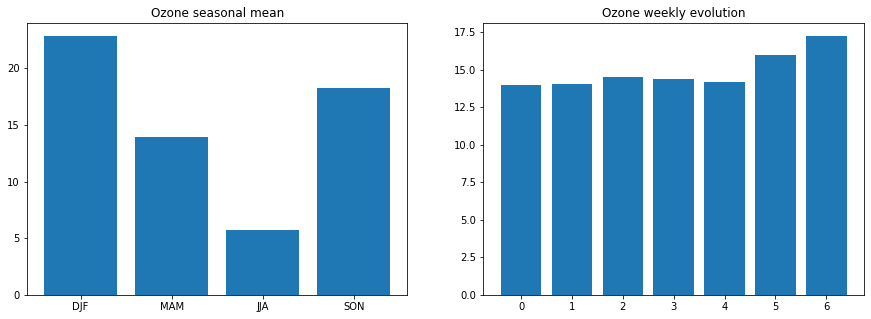

In [173]:
month_to_season_dct = {
    1: 'DJF', 2: 'DJF',
    3: 'MAM', 4: 'MAM', 5: 'MAM',
    6: 'JJA', 7: 'JJA', 8: 'JJA',
    9: 'SON', 10: 'SON', 11: 'SON',
    12: 'DJF'
}

o3['season'] = [month_to_season_dct.get(mn) for mn in o3.month]
o3_seas = o3.groupby(o3.season,as_index=False).mean()
# trick to sort seasons non alphabetically
o3_seas['season'].replace({'DJF':0, 'MAM':1, 'JJA':2, 'SON':3}, inplace=True)
o3_seas.sort_values('season',inplace=True)
o3_seas['season'].replace({0:'DJF', 1:'MAM', 2:'JJA', 3:'SON'}, inplace=True)

o3['weekday'] = o3.time.dt.dayofweek
o3_day = o3.groupby(o3.weekday,as_index=False).mean()

fig = plt.figure(figsize=(15,5))

plt.subplot(121)
plt.bar(o3_seas.season,o3_seas.ozone)
plt.title('Ozone seasonal mean')

plt.subplot(122)
plt.bar(o3_day.weekday,o3_day.ozone)
plt.title('Ozone weekly evolution')
plt.show()

Note the week-end effect nicely evidenced here, with more ozone production on Saturdays and Sundays

## Trend analysis

As an example, we investigate the trend in the ozone monthly maximum in February. 

We first group the data by year and month and use the .max() method to obtain the maximum hourly value for each month, each year.

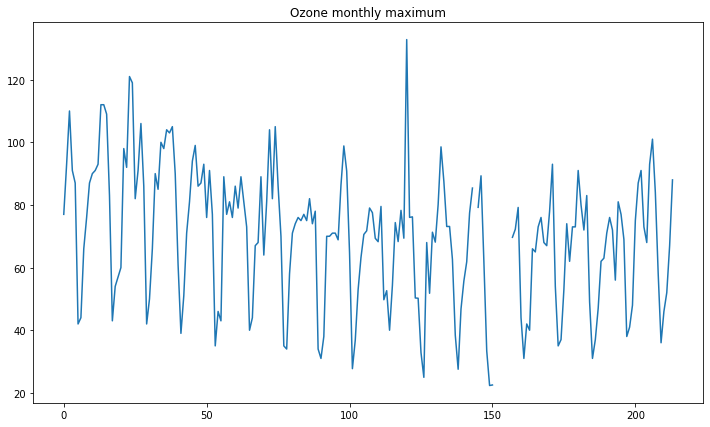

In [149]:
o3['month'] = o3.time.dt.month
o3['year'] = o3.time.dt.year
o3_monthly = o3.groupby(['year','month'],as_index=False).max()

plt.plot(o3_monthly.ozone)
plt.title('Ozone monthly maximum')
plt.show()

Since the peak in ozone appears in February in the data, we select only this month

In [150]:
o3_max_feb = o3_monthly[o3_monthly.month==2].ozone.values

Then we apply a Mann-Kendall test on this data to identify the presence of a trend (or not). This is usually an appropriate test since it is non-parametric and can handle seasonality in the data.

In [151]:
test_trend_o3 = mk.original_test(o3_max_feb)
test_trend_o3

Mann_Kendall_Test(trend='decreasing', h=True, p=0.01845706445281947, z=-2.3563189100735387, Tau=-0.4117647058823529, s=-63.0, var_s=692.3333333333334, slope=-1.7774, intercept=96.1079)

The Mann-Kendall test says there is a significant decreasing trend at the 98% level (p-value<0.02).

Let's plot the corresponding linear regression using the slope and intercept computed by the test.

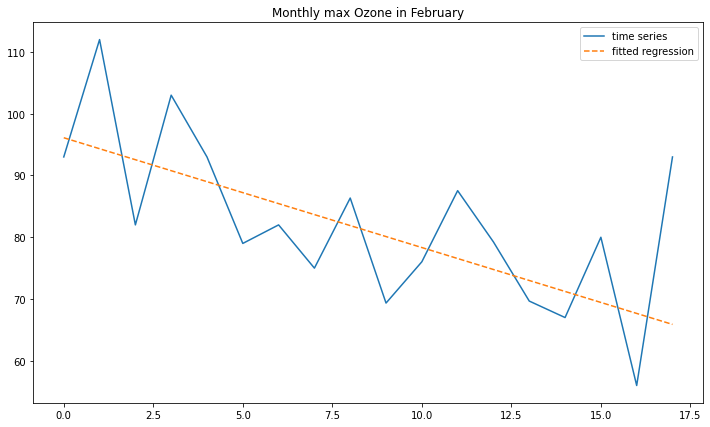

In [152]:
regression = test_trend_o3.intercept+range(len(o3_max_feb))*test_trend_o3.slope

plt.plot(o3_max_feb, label='time series')
plt.plot(regression, linestyle='--', label='fitted regression')
plt.title('Monthly max Ozone in February')
plt.legend()
plt.show()

Your turn! Manipulate the data to try and answer the following questions (or any more interesting question that you can come up with):

- What is the seasonality of PM10?
- Is there a long-term trend in PM10?
- Can you see a difference in PM10 between week-end and weekdays?
- Is PM10 related to meteorology? (temperature, wind, RH)

---
--- 

<h1 style="text-align: center;">SECTION 7: Interactive plots with hvplot</h1>

`hvplot` is one the libraries you can use to plot `xarray` or `pandas` data in a more fancy way. In particular it is convenient for interactive visualisation, as illustrated in the examples below.

Let's use our `ERA5` data set first and plot an interactive map where we can change the displayed time step. This is achieved using the groupby method in `hvplot`.

In [3]:
era5 = xr.open_dataset('ERA5_monthly_temp_2010.nc')
era5.t2m.hvplot(x='longitude', y='latitude',groupby='time', width=500, cmap='coolwarm',clim=(250,305))

:DynamicMap   [time]
   :Image   [longitude,latitude]   (t2m)

We can do the same thing with pandas using our data set of observed temperature in Santiago

In [4]:
obs = pd.read_csv('Temp_Santiago_hourly_2004-2021.csv',
                  header=0,
                  sep=',',
                  index_col=False,
                  parse_dates=['Time'])

obs["month"] = obs.Time.dt.month
obs["year"] = obs.Time.dt.year

obs.plot(groupby=['year','month'],y='Temp')

:DynamicMap   [year,month]
   :Curve   [index]   (Temp)

---
---

<h1 style="text-align: center;">BONUS SECTION: MAKE YOUR DATA SING!</h1>


Music is numbers. 

A time series is numbers.

=> A time series is music.

<p align="center">
  <img src="./snap_gb.png">
<figcaption style="text-align: center"><i>Arctic sea ice environments in a changing climate</i>, a symphony in Cminor</figcaption>
</p>


This section is largely useless, definitely very nerdy, but honestly quite fun.

## Step 1: load data

Here I use two example time series I extracted beforehand but you could do the exact same thing using Pangeo as explored previously or with your own data sets as long they are looking like a time series

In [ ]:
# yearly average sea surface temperature north of 60N in CMIP6 SSP585 scenario (1850-2099)
tos = pd.read_csv('tos.csv')
# yearly average sea ice area extent in the northern hemisphere in CMIP6 SSP585 scenario (1850-2099)
sia = pd.read_csv('sia.csv')

## Step 2: resample to create bass line and melody

Let's resample the data to obtain the desired variability frequency. Here I take sea ice extent averaged every 5 years to be used as bass line, and SST averaged every 1 year for the melody.

In [ ]:
w = 5
siaf = np.zeros(len(sia.siarean.values)-1)
for i in range(int(len(siaf)/w)):
    siaf[i*w:(i+1)*w] = np.mean(sia.siarean.values[i*w:(i+1)*w])
    
w = 1
tosf = np.zeros(len(tos.tos.values))
for i in range(int(len(tosf)/w)):
    tosf[i*w:(i+1)*w] = np.mean(tos.tos.values[i*w:(i+1)*w])

## Step 3: rescale data into acceptable pitch range

Let's rescale the data between min and max authorized pitch to make it audible. Typically, anything below 20 or above 100 is inaudible for the human ear. If you compose for your dog or dolphin you might want to change that scale...

In [ ]:
sia_ = rescale(siaf,24,72,flip=False) # flip argument to make increasing trend sound lower and vice versa
tos_ = rescale(tosf,48,84,flip=False)

## Step 4: artistic choices

In the next cell we will define the chord progression we want to have in our song. In this example, I want my chords to be C,Dm,F,Gm as inspired by the song *Wrecking Ball* by Miley Cyrus (true story). I do not constrain the order in which the chords appear, it is dictated by the values in the bass line time series. This will provide a little diversity to the song, make it less monotonous.

In MIDI format, each integer corresponds to a semitone. Therefore the distance between two octaves is 12. 0mod12 corresponds to C, 2mod12 is D, 4mod12 is E, etc... For the chord progression I want, my fundamentals are then C,D,F,G, i.e. 0,2,5,7 (*auth_fund* below) in terms of numbers. The corresponding full chords are stored in dict_keys. In the next steps, the goal is to approximate the data with closest authorized note to make it sound better than the raw data.

The choices you make here define who you are as an artist :)

In [ ]:
auth_fund = [0,2,5,7]
dict_keys = dict({'0':[0,4,7],'2':[2,5,9],'5':[5,9,0],'7':[7,10,2]})

## Step 5: extract chords progression from bass line data and apply it to melody data

In [ ]:
bassline = extract_sdt(sia_,auth_fund,1,36,96)
prog_steps = np.unique(bassline.steps.values)
keyp = bassline.note.values%12

In [ ]:
tosp = apply_progression(tos_,1,1,prog_steps,keyp,dict_keys,24,72)

In [ ]:
fig = plt.figure(figsize=(15,6))

ax = plt.subplot(121)
ax.plot(tos.year,tos.tos,color='cadetblue',label='Arctic SST')
ax.set_ylabel('Sea surface temperature ($^{\circ}$C)')
plt.legend(loc=3)
ax_ = ax.twinx()
ax_.plot(sia.year,sia.siarean,color='gray', label='Sea ice area NH')
ax.set_title('Original time series')
ax_.set_ylabel('Sea ice area (million km$^2$)')
ax.set_xlabel('Year')
plt.legend()

ax1 = plt.subplot(122)
ax1.plot(tosp.steps,tosp.note,color='cadetblue')
ax1.plot(bassline.steps,bassline.note,color='gray')
ax1.set_title('Time series into music')
ax1.set_ylabel('Pitch')
ax1.set_xlabel('Time step')

plt.subplots_adjust(wspace=0.4)
plt.show()

In [ ]:
# save both tracks into csv files and then into a single MIDIp file
tosp.to_csv('tosp')
bassline.to_csv('siap')
to_midi(['tosp','siap'],'merged')

In [ ]:
# NOTE: this command does not work on the UGA servers, you need to either run the notebook locally
# or download 'merged.mid' to your computer and play it there
launch_music('merged.mid')

### CONGRATULATIONS! You just created your first climate song!

The result may not sound super cool just yet, but as you include more tracks and use an external midi software such as `GarageBand`, the result can be much nicer. As an example, below you can play a track I created with this script and `GarageBand` using zooplankton, arctic sea ice area and concentration, and sea surface temperature from `CMIP6`.

In [ ]:
# Same as above, does not work on the UGA server
p = vlc.MediaPlayer("arctic_ocean.mp3")
p.play()

In [ ]:
p.stop()